# Homework 6
## Deep Learning Technologies
### Shruti Badrinarayanan - 016768141

# Importing required libraries

In [26]:
!pip install torch_snippets torch_summary --quiet
import itertools
from PIL import Image
from torch_snippets import *
from torchvision import transforms
from torchvision.utils import make_grid
from torchsummary import summary

In [52]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 1. Load the Monet_to_Photo Dataset using Pytorch.

In [30]:
!unzip "/content/drive/MyDrive/Deep Learning/Assignment 6/HW_06 Dataset.zip" -d "/content/drive/MyDrive/Deep Learning/Assignment 6/Data"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Deep Learning/Assignment 6/Data/HW_06 Dataset/trainB/2015-01-08 18_50_17.jpg  
  inflating: /content/drive/MyDrive/Deep Learning/Assignment 6/Data/__MACOSX/HW_06 Dataset/trainB/._2015-01-08 18_50_17.jpg  
  inflating: /content/drive/MyDrive/Deep Learning/Assignment 6/Data/HW_06 Dataset/trainB/2014-05-04 19_47_43.jpg  
  inflating: /content/drive/MyDrive/Deep Learning/Assignment 6/Data/__MACOSX/HW_06 Dataset/trainB/._2014-05-04 19_47_43.jpg  
  inflating: /content/drive/MyDrive/Deep Learning/Assignment 6/Data/HW_06 Dataset/trainB/2015-02-22 15_25_59.jpg  
  inflating: /content/drive/MyDrive/Deep Learning/Assignment 6/Data/__MACOSX/HW_06 Dataset/trainB/._2015-02-22 15_25_59.jpg  
  inflating: /content/drive/MyDrive/Deep Learning/Assignment 6/Data/HW_06 Dataset/trainB/2016-05-19 18_49_52.jpg  
  inflating: /content/drive/MyDrive/Deep Learning/Assignment 6/Data/__MACOSX/HW_06 Dataset/trainB/._2016-05-19 

### Looking at what the shape of our training images are

In [34]:
img = Image.open('/content/drive/MyDrive/Deep Learning/Assignment 6/Data/HW_06 Dataset/testA/00010.jpg')
img.size

(256, 256)

### Defining image transformations (augmentation)

In [35]:
IMAGE_SIZE = 256
device = 'cuda' if torch.cuda.is_available() else 'cpu'
transform = transforms.Compose([
    transforms.Resize(int(IMAGE_SIZE*1.33)),
    transforms.RandomCrop((IMAGE_SIZE,IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

### Making our Train and Test Dataset

In [36]:
class Monet2PhotoDataset(Dataset):
    def __init__(self, monets, photos):
        ### getting the list of images
        self.monets = Glob(monets)
        self.photos = Glob(photos)

    def __getitem__(self, ix):
        monet = self.monets[ix % len(self.monets)]
        ### Choosing a random photo image to pair with the chosen monet image
        photo = choose(self.photos)
        monet = Image.open(monet).convert('RGB')
        photo = Image.open(photo).convert('RGB')
        return monet, photo

    def __len__(self): return max(len(self.monets), len(self.photos))
    def choose(self): return self[randint(len(self))]

    def collate_fn(self, batch): #batch function
        ### The zip function breaks the tuples into two lists
        srcs, trgs = list(zip(*batch))

        srcs = torch.cat([transform(img)[None] for img in srcs], 0).to(device).float()
        trgs = torch.cat([transform(img)[None] for img in trgs], 0).to(device).float()
        return srcs.to(device), trgs.to(device)

### Initializing the Data Loader

In [37]:
trn_ds = Monet2PhotoDataset('/content/drive/MyDrive/Deep Learning/Assignment 6/Data/HW_06 Dataset/trainA', '/content/drive/MyDrive/Deep Learning/Assignment 6/Data/HW_06 Dataset/trainB')
val_ds = Monet2PhotoDataset('/content/drive/MyDrive/Deep Learning/Assignment 6/Data/HW_06 Dataset/testA', '/content/drive/MyDrive/Deep Learning/Assignment 6/Data/HW_06 Dataset/testB')

trn_dl = DataLoader(trn_ds, batch_size=1, shuffle=True, collate_fn=trn_ds.collate_fn)
val_dl = DataLoader(val_ds, batch_size=5, shuffle=True, collate_fn=val_ds.collate_fn)

# 2. Create and train Cycle GAN

In [38]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, "bias") and m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

### Defining a Residual Block

In [39]:
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()

        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features),
        )

    def forward(self, x):
        return x + self.block(x)

### Generator Class

In [40]:
class GeneratorResNet(nn.Module):
    def __init__(self, num_residual_blocks=9):
        super(GeneratorResNet, self).__init__()
        out_features = 64
        channels = 3
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(channels, out_features, 7),
            nn.InstanceNorm2d(out_features),
            nn.ReLU(inplace=True),
        ]
        in_features = out_features
        # Downsampling
        for _ in range(2):
            out_features *= 2
            model += [
                nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features

        # Residual blocks
        for _ in range(num_residual_blocks):
            model += [ResidualBlock(out_features)]

        # Upsampling
        for _ in range(2):
            out_features //= 2
            model += [
                nn.Upsample(scale_factor=2),
                nn.Conv2d(in_features, out_features, 3, stride=1, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features

        # Output layer
        model += [nn.ReflectionPad2d(channels), nn.Conv2d(out_features, channels, 7), nn.Tanh()]
        self.model = nn.Sequential(*model)
        self.apply(weights_init_normal)
    def forward(self, x):
        return self.model(x)

### Discriminator Class

In [41]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        channels, height, width = 3, IMAGE_SIZE, IMAGE_SIZE

        def discriminator_block(in_filters, out_filters, normalize=True):
            """Returns downsampling layers of each discriminator block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(channels, 64, normalize=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )
        self.apply(weights_init_normal)

    def forward(self, img):
        return self.model(img)

### How do we generate samples from our Cycle GAN

In [42]:
@torch.no_grad()
def generate_sample():
    data = next(iter(val_dl))
    G_AB.eval()
    G_BA.eval()

    real_A, real_B = data
    fake_B = G_AB(real_A)
    fake_A = G_BA(real_B)
    # Arange images along x-axis
    real_A = make_grid(real_A, nrow=5, normalize=True)
    real_B = make_grid(real_B, nrow=5, normalize=True)
    fake_A = make_grid(fake_A, nrow=5, normalize=True)
    fake_B = make_grid(fake_B, nrow=5, normalize=True)
    # Arange images along y-axis
    image_grid = torch.cat((real_A, fake_B, real_B, fake_A), 1)
    show(image_grid.detach().cpu().permute(1,2,0).numpy(), sz=12)

### Defining the Generator Training Step

In [43]:
def generator_train_step(Gs, optimizer, real_A, real_B):
    G_AB, G_BA = Gs
    optimizer.zero_grad()
    loss_id_A = criterion_identity(G_BA(real_A), real_A)
    loss_id_B = criterion_identity(G_AB(real_B), real_B)

    loss_identity = (loss_id_A + loss_id_B) / 2
    fake_B = G_AB(real_A)
    loss_GAN_AB = criterion_GAN(D_B(fake_B), torch.Tensor(np.ones((len(real_A), 1, 16, 16))).to(device))
    fake_A = G_BA(real_B)
    loss_GAN_BA = criterion_GAN(D_A(fake_A), torch.Tensor(np.ones((len(real_A), 1, 16, 16))).to(device))

    loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2
    recov_A = G_BA(fake_B)
    loss_cycle_A = criterion_cycle(recov_A, real_A)
    recov_B = G_AB(fake_A)
    loss_cycle_B = criterion_cycle(recov_B, real_B)

    loss_cycle = (loss_cycle_A + loss_cycle_B) / 2
    loss_G = loss_GAN + lambda_cyc * loss_cycle + lambda_id * loss_identity
    loss_G.backward()
    optimizer.step()
    return loss_G, loss_identity, loss_GAN, loss_cycle, loss_G, fake_A, fake_B

### Defining the Discriminator Training Step

In [44]:
def discriminator_train_step(D, real_data, fake_data, optimizer):
    optimizer.zero_grad()
    loss_real = criterion_GAN(D(real_data), torch.Tensor(np.ones((len(real_data), 1, 16, 16))).to(device))
    loss_fake = criterion_GAN(D(fake_data.detach()), torch.Tensor(np.zeros((len(real_data), 1, 16, 16))).to(device))
    loss_D = (loss_real + loss_fake) / 2
    loss_D.backward()
    optimizer.step()
    return loss_D

In [45]:
G_AB = GeneratorResNet().to(device)
G_BA = GeneratorResNet().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=0.0002, betas=(0.5, 0.999)
)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

lambda_cyc, lambda_id = 10.0, 5.0

# 3. Training the CYCLE GAN. Display Results (Converted Images)

EPOCH: 1.000  loss_D: 0.183  loss_G: 2.812  loss_GAN: 0.502  loss_cycle: 0.162  loss_identity: 0.138  (755.10s - 3020.41s remaining)

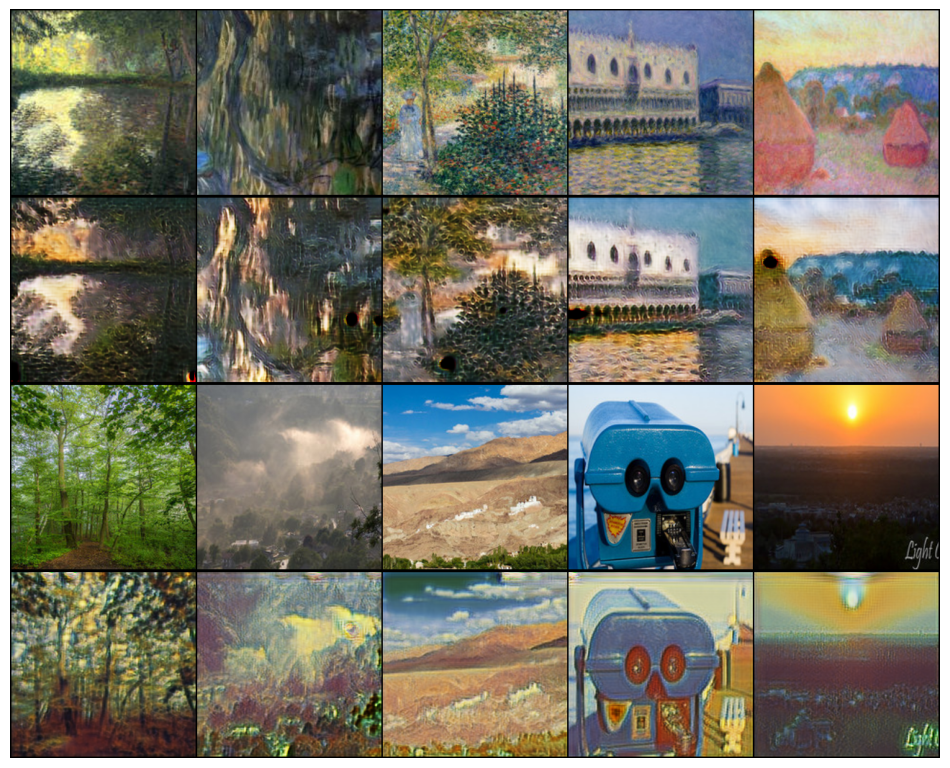

EPOCH: 1.000  loss_cycle: 0.245  loss_D: 0.220  loss_G: 4.096  loss_GAN: 0.515  loss_identity: 0.226  (756.16s - 3024.63s remaining)
EPOCH: 2.000  loss_D: 0.257  loss_G: 3.235  loss_GAN: 0.502  loss_cycle: 0.182  loss_identity: 0.183  (1512.03s - 2268.04s remaining)

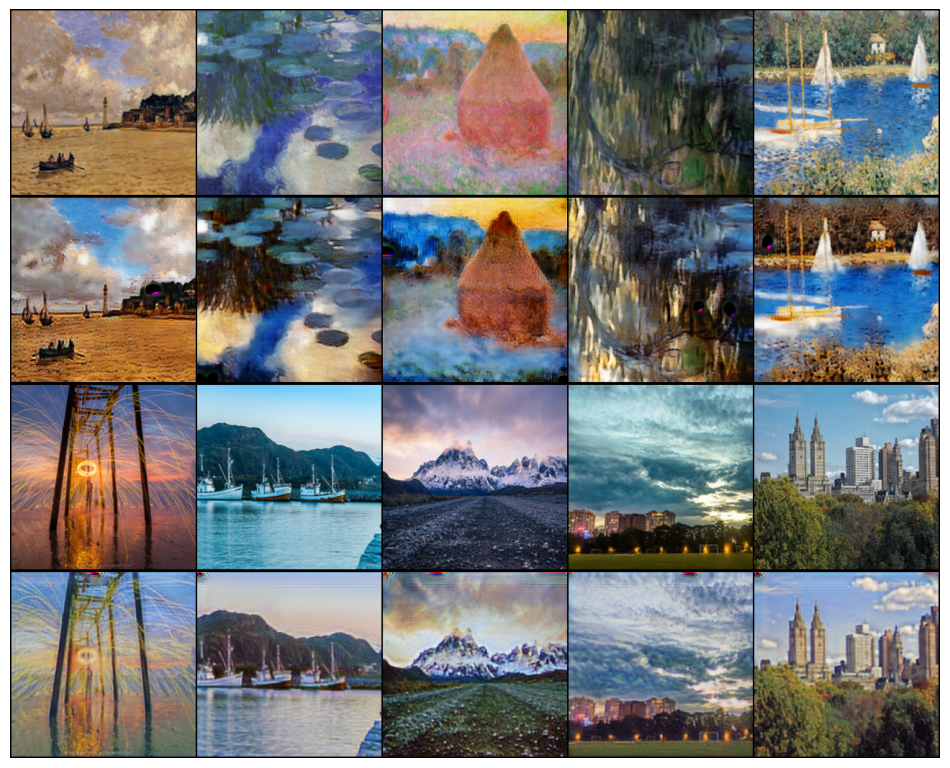

EPOCH: 2.000  loss_cycle: 0.198  loss_D: 0.210  loss_G: 3.375  loss_GAN: 0.484  loss_identity: 0.181  (1512.94s - 2269.41s remaining)
EPOCH: 3.000  loss_D: 0.156  loss_G: 2.814  loss_GAN: 0.742  loss_cycle: 0.145  loss_identity: 0.125  (2271.27s - 1514.18s remaining)

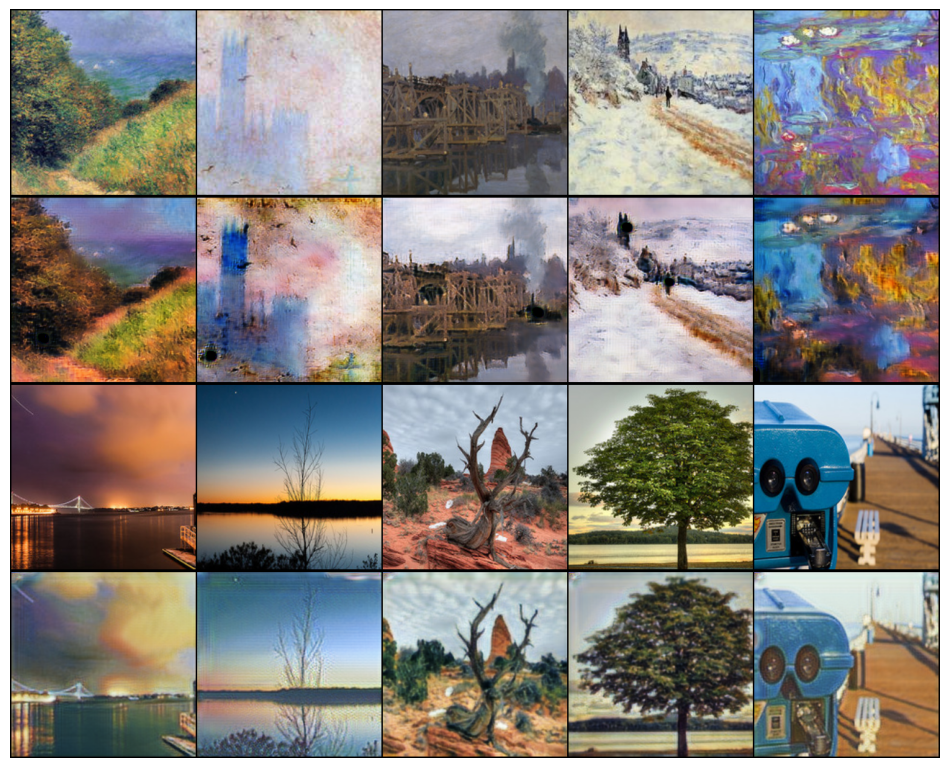

EPOCH: 3.000  loss_cycle: 0.179  loss_D: 0.199  loss_G: 3.125  loss_GAN: 0.501  loss_identity: 0.166  (2272.16s - 1514.77s remaining)
EPOCH: 4.000  loss_D: 0.122  loss_G: 4.008  loss_GAN: 0.746  loss_cycle: 0.234  loss_identity: 0.183  (3036.20s - 759.05s remaining)

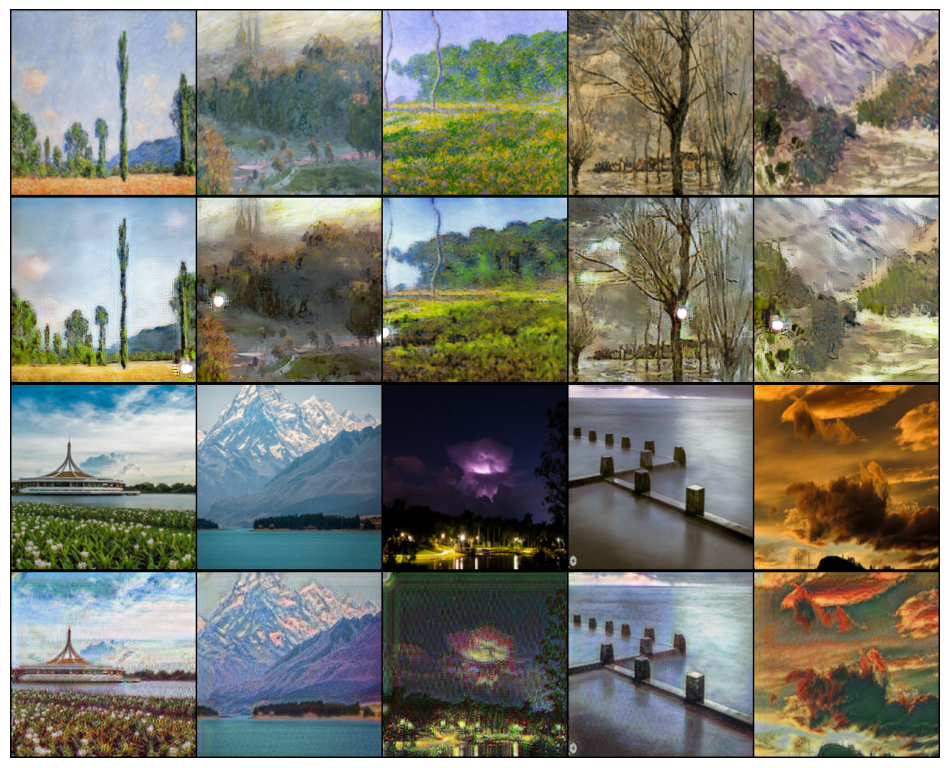

EPOCH: 4.000  loss_cycle: 0.169  loss_D: 0.186  loss_G: 3.008  loss_GAN: 0.527  loss_identity: 0.158  (3037.09s - 759.27s remaining)
EPOCH: 5.000  loss_D: 0.191  loss_G: 2.481  loss_GAN: 0.475  loss_cycle: 0.134  loss_identity: 0.133  (3799.21s - 0.00s remaining)

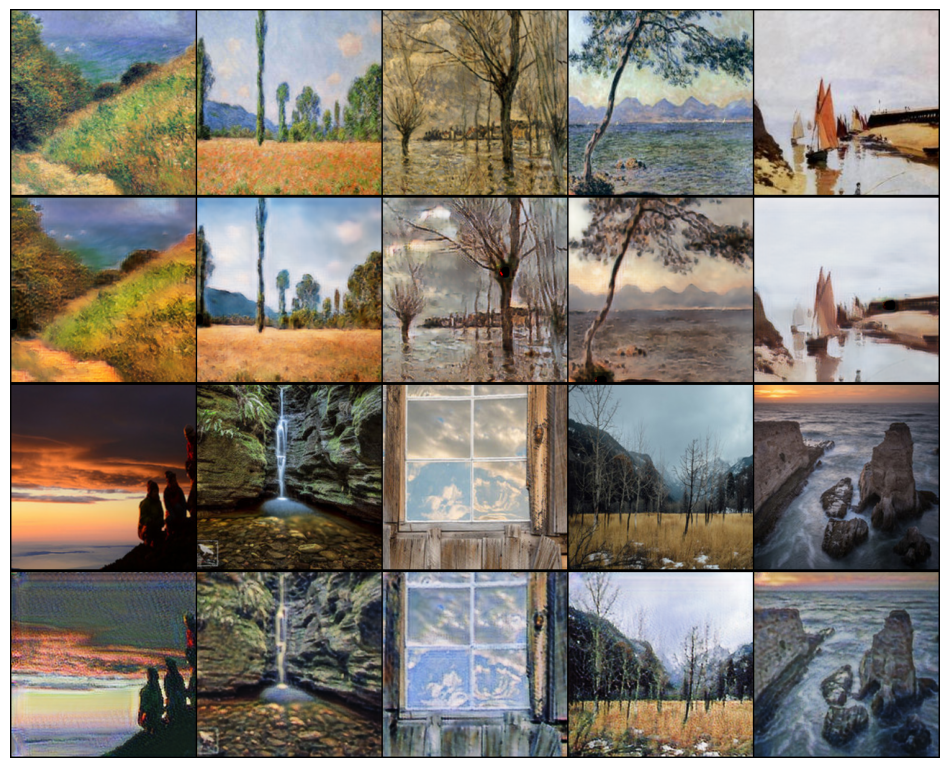

EPOCH: 5.000  loss_cycle: 0.165  loss_D: 0.172  loss_G: 2.977  loss_GAN: 0.563  loss_identity: 0.154  (3800.10s - 0.00s remaining)


In [46]:
n_epochs = 5
log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(trn_dl)
    for bx, batch in enumerate(trn_dl):
        real_A, real_B = batch

        loss_G, loss_identity, loss_GAN, loss_cycle, loss_G, fake_A, fake_B = generator_train_step((G_AB,G_BA), optimizer_G, real_A, real_B)
        loss_D_A = discriminator_train_step(D_A, real_A, fake_A, optimizer_D_A)
        loss_D_B = discriminator_train_step(D_B, real_B, fake_B, optimizer_D_B)
        loss_D = (loss_D_A + loss_D_B) / 2

        log.record(epoch+(1+bx)/N, loss_D=loss_D.item(), loss_G=loss_G.item(),
                   loss_GAN=loss_GAN.item(), loss_cycle=loss_cycle.item(),
                   loss_identity=loss_identity.item(), end='\r')
    generate_sample()

    log.report_avgs(epoch+1)

100%|██████████| 106/106 [00:02<00:00, 43.24it/s]


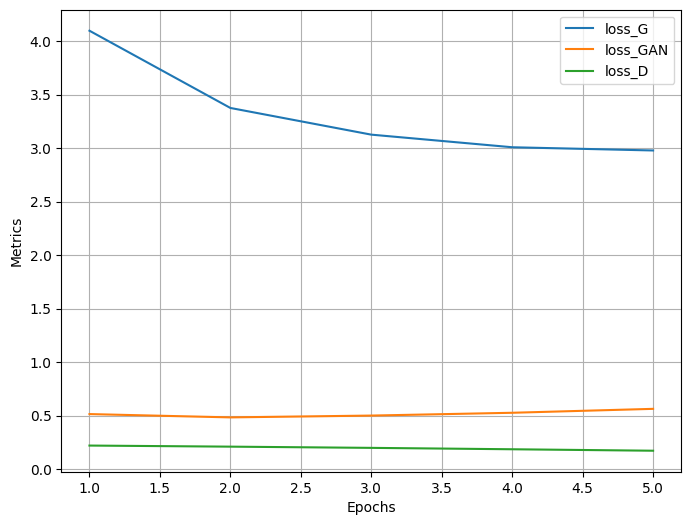

In [47]:
log.plot_epochs(['loss_G','loss_GAN', 'loss_D'])

## 3. Show some Converted Images from Validation Set

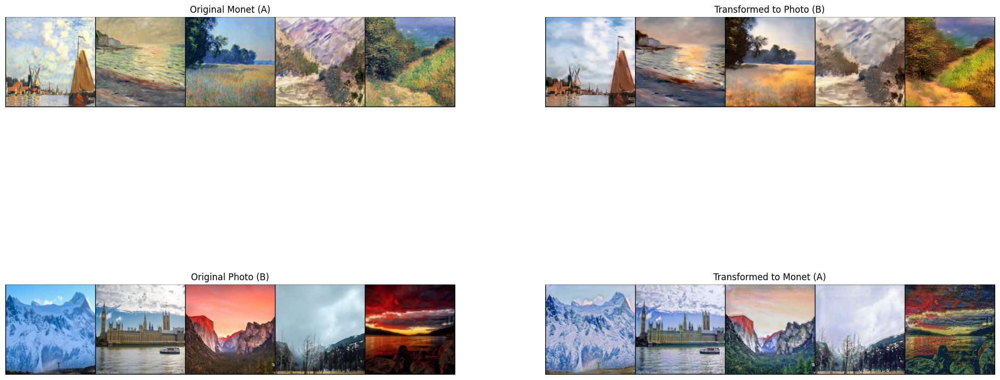

In [68]:
import torchvision.utils as vutils

# Function to display images
def show_transformations(real_A, fake_B, real_B, fake_A):
    plt.figure(figsize=(24, 12))

    # Display real images from domain A (e.g., Monets)
    plt.subplot(2, 2, 1)
    plt.title("Original Monet (A)")
    real_A_img = vutils.make_grid(real_A, normalize=True, scale_each=True)
    plt.imshow(np.transpose(real_A_img.cpu().numpy(), (1, 2, 0)))
    plt.axis('off')

    # Display transformed images - domain A to domain B (e.g., Monets to photos)
    plt.subplot(2, 2, 2)
    plt.title("Transformed to Photo (B)")
    fake_B_img = vutils.make_grid(fake_B, normalize=True, scale_each=True)
    plt.imshow(np.transpose(fake_B_img.cpu().numpy(), (1, 2, 0)))
    plt.axis('off')

    # Display real images from domain B (e.g., Photos)
    plt.subplot(2, 2, 3)
    plt.title("Original Photo (B)")
    real_B_img = vutils.make_grid(real_B, normalize=True, scale_each=True)
    plt.imshow(np.transpose(real_B_img.cpu().numpy(), (1, 2, 0)))
    plt.axis('off')

    # Display transformed images - domain B to domain A (e.g., Photos to Monets)
    plt.subplot(2, 2, 4)
    plt.title("Transformed to Monet (A)")
    fake_A_img = vutils.make_grid(fake_A, normalize=True, scale_each=True)
    plt.imshow(np.transpose(fake_A_img.cpu().numpy(), (1, 2, 0)))
    plt.axis('off')

    plt.show()

# Take one batch from the validation DataLoader
val_iter = iter(val_dl)
real_A, real_B = next(val_iter)
real_A, real_B = real_A.to(device), real_B.to(device)

# Perform the transformation with G_AB and G_BA
with torch.no_grad():
    fake_B = G_AB(real_A)
    fake_A = G_BA(real_B)

# Display the images
show_transformations(real_A, fake_B, real_B, fake_A)

# 4. Convert a new Photo to Monet by applying CycleGAN

Original Image:

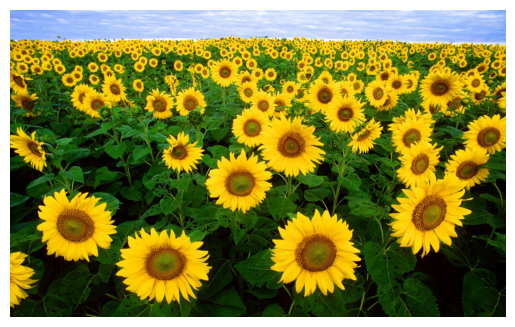

Preprocessed Image:

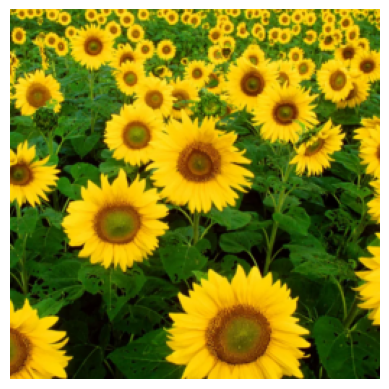

Monet Image:

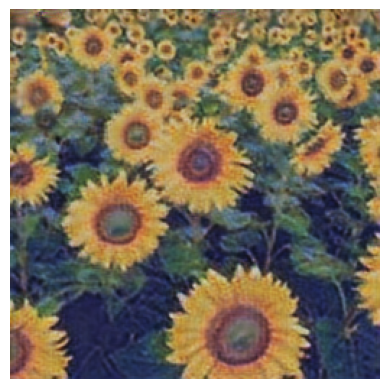

In [69]:
IMAGE_SIZE = 256
device = 'cuda' if torch.cuda.is_available() else 'cpu'
transform = transforms.Compose([
    transforms.Resize(int(IMAGE_SIZE*1.33)),
    transforms.RandomCrop((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

from PIL import Image

# Load the image file
photo_path = '/content/flower.jpg'
photo_image = Image.open(photo_path).convert('RGB')
photo_image = transform(photo_image).unsqueeze(0).to(device)

# Convert the photo to Monet-style painting
# G_BA is the trained generator for converting from Photo to Monet
monet_style_image = G_BA(photo_image)

import matplotlib.pyplot as plt
import torchvision.transforms as T

# Convert the tensor to a displayable image
def tensor_to_image(tensor):
    tensor = tensor[0].detach().cpu()
    tensor = (tensor + 1) / 2  # Undo normalization
    tensor = tensor.clamp(0, 1)
    tensor = T.ToPILImage()(tensor)
    return tensor

print("Original Image:\n")
# Display the original photo
original_image = Image.open(photo_path).convert('RGB')
plt.imshow(original_image)
plt.axis('off')  # Hide the axes
plt.show()

print("\n\nPreprocessed Image:\n")
# Display the preprocessed photo
preprocessed_image = tensor_to_image(photo_image)
plt.imshow(preprocessed_image)
plt.axis('off')  # Hide the axes
plt.show()

print("\n\nMonet Image:\n")
# Display the Monet-Style Image
converted_image = tensor_to_image(monet_style_image)
plt.imshow(converted_image)
plt.axis('off')  # Hide the axes
plt.show()

# Save the image
converted_image.save('/content/drive/MyDrive/Deep Learning/Assignment 6/monet_style_image_1.jpg')